# Image captioning model - Load pretrained

In [2]:
import torch
from transformers import GitForCausalLM, AutoProcessor, AutoConfig

base_checkpoint = 'microsoft/git-large-r-coco'
processor = AutoProcessor.from_pretrained(base_checkpoint)

config = AutoConfig.from_pretrained(base_checkpoint)
model = GitForCausalLM(config)

In [47]:
# Load the pre-trained model
checkpoint = 'childrensimages-caption-20231109'
model.load_state_dict(torch.load(checkpoint))

<All keys matched successfully>

In [48]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)

GitForCausalLM(
  (git): GitModel(
    (embeddings): GitEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(1024, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (image_encoder): GitVisionModel(
      (vision_model): GitVisionTransformer(
        (embeddings): GitVisionEmbeddings(
          (patch_embedding): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
          (position_embedding): Embedding(257, 1024)
        )
        (pre_layrnorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (encoder): GitVisionEncoder(
          (layers): ModuleList(
            (0-23): 24 x GitVisionEncoderLayer(
              (self_attn): GitVisionAttention(
                (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
                (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
      

# Inference

In [49]:
from PIL import Image

# Function to generate caption
def generate_caption(img_path):
    image = Image.open(img_path)
    
    # prepare image for the model
    inputs = processor(images=image, return_tensors="pt").to(device)
    pixel_values = inputs.pixel_values

    generated_ids = model.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return image, generated_caption

In [50]:
img_root_path = '../Datasets/childrens-books-test/'

In [51]:
import os 
# Define a list of images
imgs_validation = os.listdir(img_root_path)
imgs_validation.remove('.ipynb_checkpoints')
imgs_captions = {}

In [52]:
from tqdm.auto import tqdm
progress_bar = tqdm(range(len(imgs_validation)))

# Caption test images
for img in imgs_validation:
    image, generated_caption = generate_caption(img_root_path + img)
    imgs_captions[img] = {'image':image, 'caption':generated_caption}
    progress_bar.update(1)

  0%|          | 0/190 [00:00<?, ?it/s]

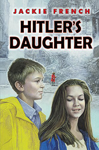

Generated caption:  drawing of a boy and a girl in the snow with the title " his daughter "




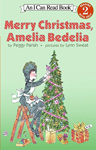

Generated caption:  drawing of a mouse by a christmas tree with the title " merry christmas, amelia berenia "




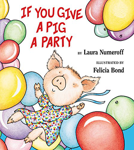

Generated caption:  drawing of a pig with balloons and the title " if you give a pig a party "




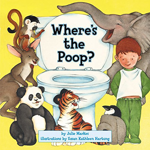

Generated caption:  drawing of children with animals in the toilet with the title " where's in the poop? "




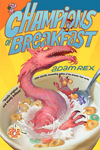

Generated caption:  drawing of a red monster with the title " i am breakfast "




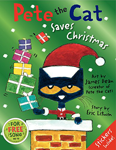

Generated caption:  drawing of a cat with a red hat and presents with the title " pete cat saves christmas "




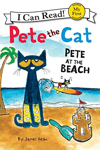

Generated caption:  drawing of a cat and a beach with the title " pete the cat at the beach "




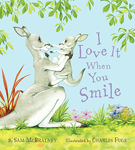

Generated caption:  drawing of two animals dancing in a garden with the title " i love it when you smile "




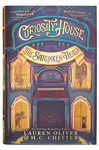

Generated caption:  drawing of a blue door and the title " the curious house "




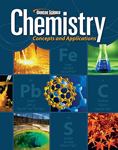

Generated caption:  picture of different objects with the title " chemistry "




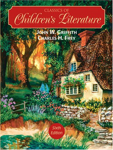

Generated caption:  drawing of a house in a garden with the title " children's literature "




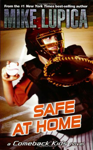

Generated caption:  picture of a boy with a helmet and the title " safe love "




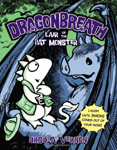

Generated caption:  drawing of a white dragon and a blue monster with the title " dragonheath "




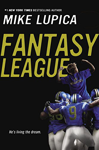

Generated caption:  picture of two players with the title " fantasy league "




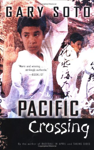

Generated caption:  picture of a boy and a boy with the title " pacific "




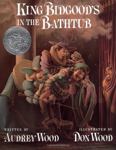

Generated caption:  drawing of a man, two girls, and a cat with the title " in the bathtub "




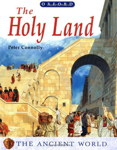

Generated caption:  drawing of people in a building by a door with the title " holy land "




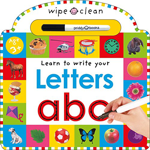

Generated caption:  picture of different objects and the title " learn to write your letters abc "




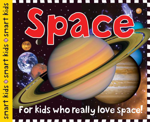

Generated caption:  picture of planets with the title " space "




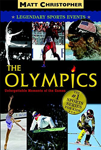

Generated caption:  pictures of olympic athletes and the title " the olympic olympics "




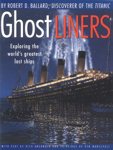

Generated caption:  picture of a building with smoke and the title " ghost liners "




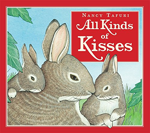

Generated caption:  drawing of two rabbits with the title " all kinds of kisses "




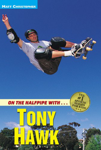

Generated caption:  picture of a skateboarder with the title " on the armless skateboard with... on the edge of.. "




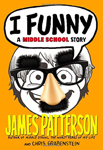

Generated caption:  drawing of a face with glasses and the title " i penny a middle school story "




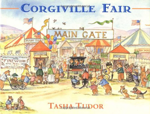

Generated caption:  drawing of a fair with people and animals at the gate " cournie fair "




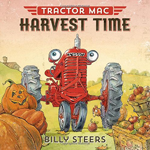

Generated caption:  drawing of a red tractor and a pumpkin with the title " tractor harvest time "




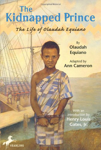

Generated caption:  drawing of a boy with a striped shirt and the title " the life of ocalae "




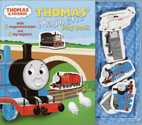

Generated caption:  drawing of a train and the title " thomas'magnets playbook "




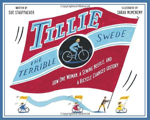

Generated caption:  drawing of a person riding a bicycle with the title " the terrible screech "




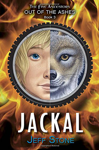

Generated caption:  drawing of a boy and a wolf with the title " jackal "




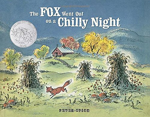

Generated caption:  drawing of a fox in a green field with the title " the fox won't out on a chilly night "




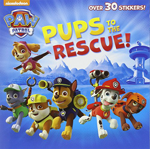

Generated caption:  drawing of animals with the title " pups to the rescue! "




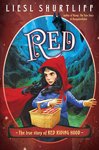

Generated caption:  drawing of a girl with a red hood and a basket in a forest with the title " red "




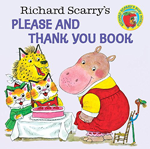

Generated caption:  drawing of a pig, a pig, and a cat eating with the title " richard scarry's please and thank you book "




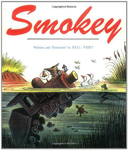

Generated caption:  drawing of a man riding a horse by a river with the title " smokey "




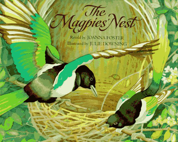

Generated caption:  drawing of two birds in a nest with the title " the magic of the magbs nest "




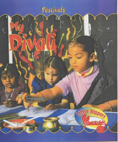

Generated caption:  picture of children and the title " my diwali "




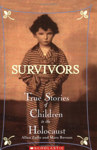

Generated caption:  picture of a boy with striped pajamas and the title " survival stories true stories of children "




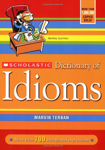

Generated caption:  drawing of a boy in a desk with the title " school dictionary of indians "




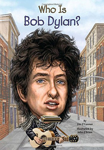

Generated caption:  drawing of a woman's face in a city with the title " bob birkle "




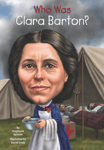

Generated caption:  drawing of a woman with the title " once a barbell "




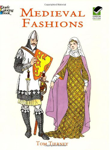

Generated caption:  drawing of a man and a woman with a shield and the title " fashions "




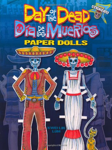

Generated caption:  drawing of two robots with hats and the title " de mures "




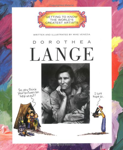

Generated caption:  drawing of a woman with her face in a frame with the title " dork lage "




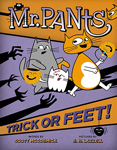

Generated caption:  drawing of two cats and a cat with the title " mr. pants trick or feet! "




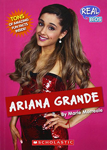

Generated caption:  picture of a woman with a red dress and the title " serena grande "




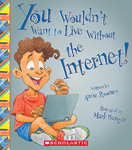

Generated caption:  drawing of a boy holding a book with the title " you wouldn't want to live without the internet! "




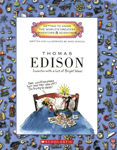

Generated caption:  drawing of a man and a woman in a bed with the caption " thomas edison "




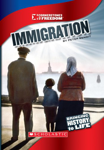

Generated caption:  picture of two adults and a child with the title " immigration "




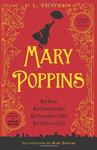

Generated caption:  drawing of a girl with a red background and the title " mary poppies "




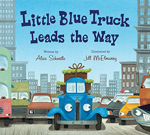

Generated caption:  drawing of a blue car in a city with the title " little blue truck leads the way "




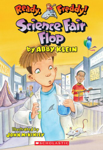

Generated caption:  drawing of a boy holding a flask with the title " science fair hopi "




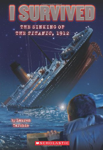

Generated caption:  drawing of a ship sinking in the sea with the title " the sinking of the titanic "




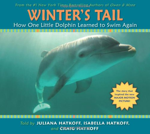

Generated caption:  picture of a dolphin with the title " winter's tail "




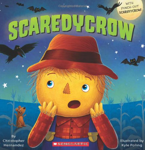

Generated caption:  drawing of a scarecrow with bats and the title " scarecrow "




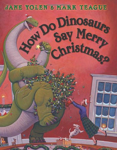

Generated caption:  drawing of a dinosaur holding a garland with the title " how do dinosaurs say merry christmas? "




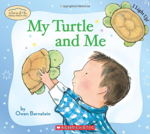

Generated caption:  drawing of a boy holding a turtle and the title " my turtle and me "




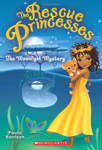

Generated caption:  drawing of a girl in a yellow dress and a cat with the title " princesses "




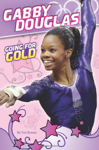

Generated caption:  picture of a girl dancing with the title " going for gold "




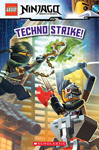

Generated caption:  drawing of two masked men and a green dragon with the title " cyber strike! "




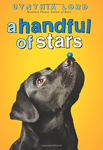

Generated caption:  picture of a black dog with a blue ball below the title " ayunch of stars "




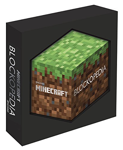

Generated caption:  drawing of a green and brown cube with the caption " minecraft blockia "




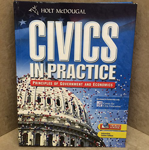

Generated caption:  picture of a building with the title " civic impassion "




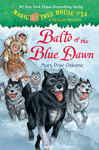

Generated caption:  drawing of dogs and a man with the title " bat of the blue dawn "




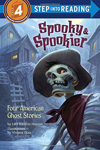

Generated caption:  drawing of a skeleton with a hat and the title " skull of spooky & spooky halloween stories "




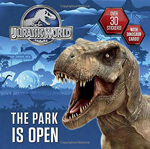

Generated caption:  drawing of a dinosaur with the caption " the park is open "




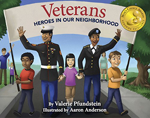

Generated caption:  drawing of two men and a girl holding a flag with the title " veterans heroes in our neighborhood "




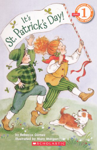

Generated caption:  drawing of a boy and a girl dressed in green with a dog and the title " st. patrick's day "




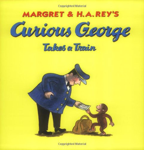

Generated caption:  drawing of a man with a hat and a train with the title " curious george takes a train "




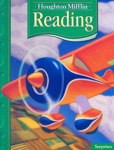

Generated caption:  drawing of a colorful bird and the title " reading "




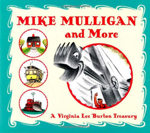

Generated caption:  drawing of a bulldozer and a house with the title " mike mulan and more "




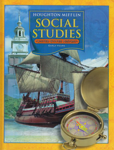

Generated caption:  drawing of a ship and a compass with the title " social studies "




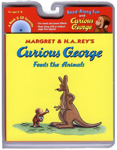

Generated caption:  drawing of a brown kangaroo and a mouse with the title " curious george "




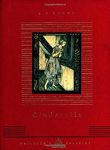

Generated caption:  drawing of a woman with a dress and the title " ballerina "




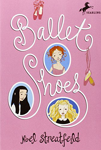

Generated caption:  drawing of girls and colorful shoes with the title " ballet shoes "




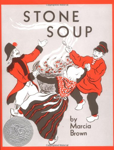

Generated caption:  drawing of two men and a woman with red clothes with the title " stone soup "




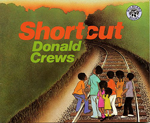

Generated caption:  drawing of children and a man in a stairs with the title " shortcut john crews "




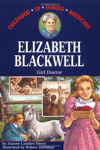

Generated caption:  drawing of a girl holding a basket with apples and the title " elizabethan "




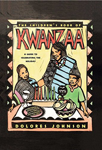

Generated caption:  drawing of two adults and a child with the title " kwanzaa "




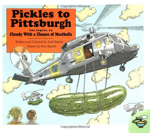

Generated caption:  drawing of a helicopter with the title " pickles to pittsburgh "




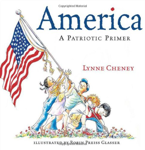

Generated caption:  drawing of people holding a flag and the title " america a patriotic primer "




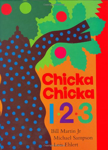

Generated caption:  drawing of a chicken with the title " chicken nukina "




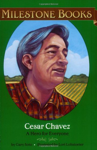

Generated caption:  drawing of a man with a plaid shirt and the title " man's face "




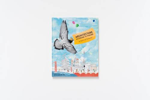

Generated caption:  drawing of a bird in the sky with the title " architecture "




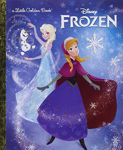

Generated caption:  drawing of a girl in blue dress and a snowman with the title " frozen "




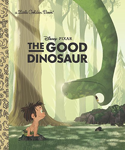

Generated caption:  drawing of a boy and a dinosaur with the title " the good dinosaur "




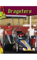

Generated caption:  picture of a person with a helmet and the title " the major league of the cinereousos "




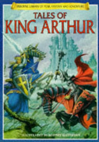

Generated caption:  drawing of two warriors with the title " king arthur "




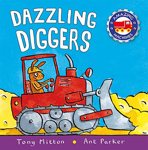

Generated caption:  drawing of a dog on a red tractor with the title " shining diggingrs "




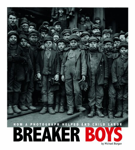

Generated caption:  picture of men with hats and the title " breaker boys "




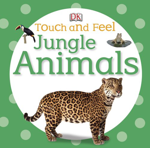

Generated caption:  picture of a leopard with the title " touch and feel jungle animals "




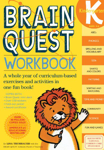

Generated caption:  drawing of a lion with the title " dream quest workbook "




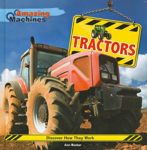

Generated caption:  picture of a red tractor with the title " amazing tractors "




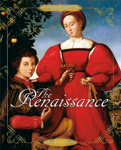

Generated caption:  drawing of a man and a woman with red clothes below the title " the renaissance "




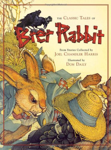

Generated caption:  drawing of a rabbit and a rabbit with the title " beer rabbit "




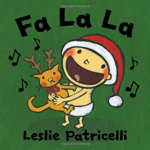

Generated caption:  drawing of a baby with a red hat holding a yellow cat and the title " fa la "




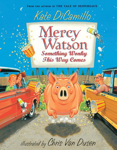

Generated caption:  drawing of a pig in a car with the title " mercy wilson "




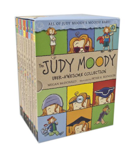

Generated caption:  drawing of different colorful objects with the caption " the junie fuzzy "




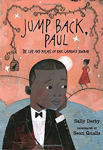

Generated caption:  drawing of a man with black suit and a girl below the caption " jump back, paul "




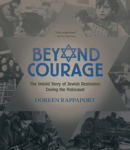

Generated caption:  picture of a crowd with the title " beyond courage "




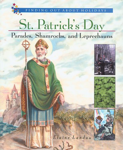

Generated caption:  drawing of a man holding a stick with the title " st. patrick's day "




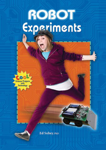

Generated caption:  picture of a girl dancing with the title " experiments "




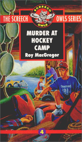

Generated caption:  drawing of a boy in a boat by the river with the title " murder at hockey camp "




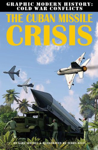

Generated caption:  picture of airplanes and a helicopter with the title " crisis "




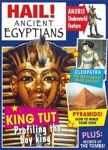

Generated caption:  picture of a golden egyptian head and a woman with the title " ancient egypt "




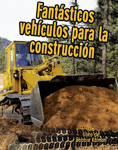

Generated caption:  picture of a yellow bulldozer and the title " bulldozers para paver "




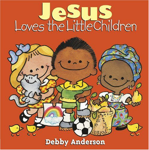

Generated caption:  drawing of children and the caption " jesus loves the little children "




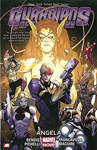

Generated caption:  drawing of a man with weapons and the title " warriors "




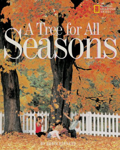

Generated caption:  picture of a tree and two trees with orange leaves with the title " a tree for seasons "




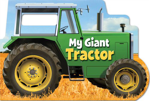

Generated caption:  picture of a green tractor with the title " my giant tractor "




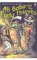

Generated caption:  drawing of men with hats and the title " forty three thieves "




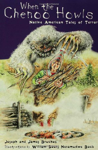

Generated caption:  drawing of a girl holding a stick in a forest with the title " the good place "




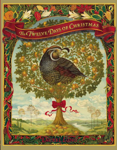

Generated caption:  drawing of a bird on a tree with apples and the title " the three days of christmas "




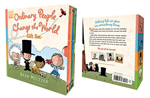

Generated caption:  drawing of children and a cat with the title " human people into the world "




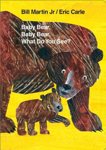

Generated caption:  drawing of a bear and a baby bear with the title " baby bear, baby bear, what do you see? "




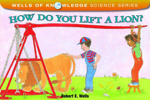

Generated caption:  drawing of a boy with a hat and a horse in a garden with the title " how do you lift a ladder "




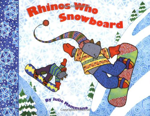

Generated caption:  drawing of two mice in the sky and the title " animals who snowboard "




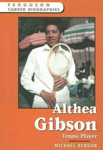

Generated caption:  picture of a woman holding a racket with the title " althea gibson "




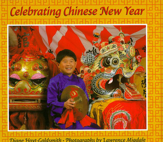

Generated caption:  picture of a boy holding a golden dragon and the title " celebrating chinese new year "




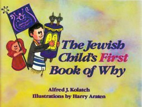

Generated caption:  drawing of a boy holding a book with the title " the david child's first book of why "




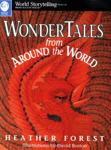

Generated caption:  picture of a red fish with the title " wonderful tales from around the world "




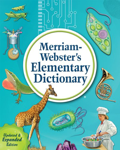

Generated caption:  drawing of a giraffe, a man, and animals with the title " merman's elementary dictionary "




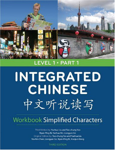

Generated caption:  picture of different chinese objects and the title " level 1 "




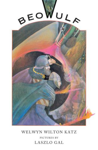

Generated caption:  drawing of a man with a blue hat and colorful clothes with the title " drawing of a man with the title " in the middle "




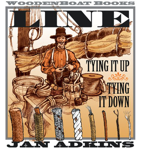

Generated caption:  drawing of a man with hat and working with the title " tie up, "




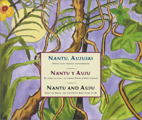

Generated caption:  drawing of a jungle with the title " nauuuu auuuuuuu "




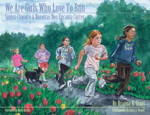

Generated caption:  drawing of children running in a flower field with the title " girls who love to run "




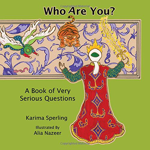

Generated caption:  drawing of a woman with a red dress and a book of very serious questions with the title " who are you? a book of very serious questions "




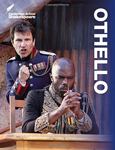

Generated caption:  picture of a man and a woman with the title " ohmi "




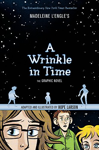

Generated caption:  drawing of a boy and a girl in a starry night with the title " a wrinkle in time "




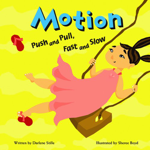

Generated caption:  drawing of a girl with a pink dress and the title " motion "




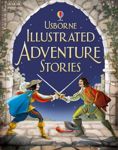

Generated caption:  drawing of two men with yellow clothes and the title " usborne illustrated adventure stories "




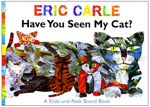

Generated caption:  drawing of a cat and a cat with the title " erithe have you seen my cat "




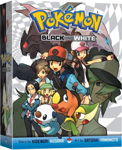

Generated caption:  drawing of children and animals with the title " pokemon black and white "




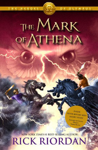

Generated caption:  drawing of two men in a horse and a lightning with the title " the mark of althea "




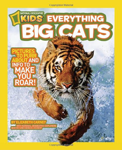

Generated caption:  picture of a tiger with the title " everything cats "




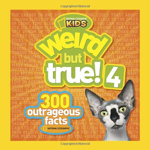

Generated caption:  drawing of a dog with the title " weird but true! "




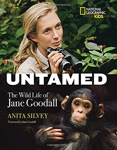

Generated caption:  picture of a woman holding a camera and a monkey with the title " the wild life of jane gorg gorg "




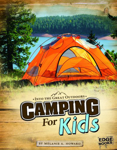

Generated caption:  drawing of a tent by a river and the title " camping for kids "




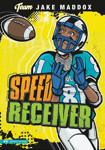

Generated caption:  drawing of a football player and the caption " speeder "




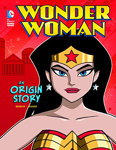

Generated caption:  drawing of a woman with a golden cape and the title " wonder woman "




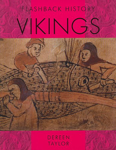

Generated caption:  drawing of people and a man in a boat with the title " viking "




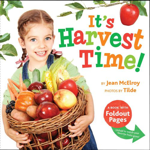

Generated caption:  picture of a girl holding a basket with fruits and the title " it's harvest time! "




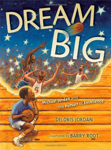

Generated caption:  drawing of people playing basketball and the title " dream big "




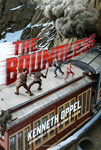

Generated caption:  drawing of two men and a girl in a train with the title " the four bounds "




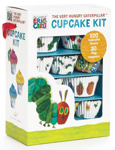

Generated caption:  drawing of a green caterpig with the title " cupcake kit "




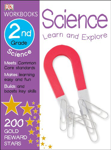

Generated caption:  picture of a red magnet with the title " 2nd grade science "




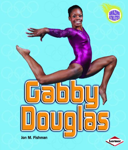

Generated caption:  picture of a girl dancing with the title " baby bump "




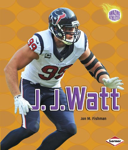

Generated caption:  picture of an american football player with the title " j. j. watt "




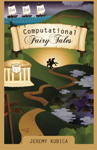

Generated caption:  drawing of a girl in a hill and a house with the title " compostable fairy tales "




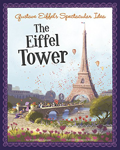

Generated caption:  drawing of the eiffel tower by the river with the title " the eiffel tower "




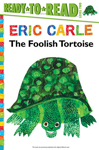

Generated caption:  drawing of a green turtle with the title " erobot the folk turtle "




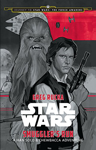

Generated caption:  drawing of a man and a star wars with the title " star wars "




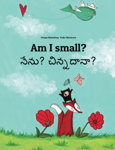

Generated caption:  drawing of a girl with a red dress and a butterfly with the title " am i small? "




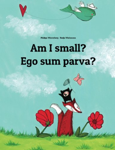

Generated caption:  drawing of a girl with a red dress and a butterfly with the title " am i small? egg sum? "




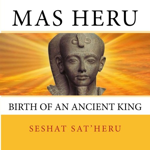

Generated caption:  picture of a head with the title " masseiur " and " birth of an ancient king "




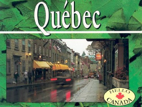

Generated caption:  picture of a street with buildings and the title " que quebec "




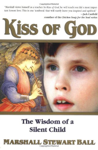

Generated caption:  drawing of a girl with a headdress and the title " kiss of god "




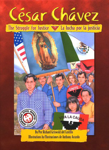

Generated caption:  drawing of people holding a flag and the title " the struggle for justice "




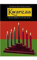

Generated caption:  picture of a chandelier with candles and the title " kwanzaa "




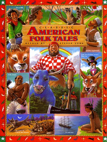

Generated caption:  drawing of animals with the title " american folk tales "




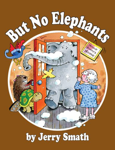

Generated caption:  drawing of an elephant, a turtle, and a turtle in a red door with the title " but no elephants "




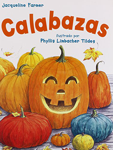

Generated caption:  drawing of a pumpkin with the title " calaveras "




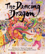

Generated caption:  drawing of a colorful dragon and the title " the dancing dragon "




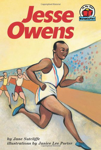

Generated caption:  drawing of a man running and the title " owen "




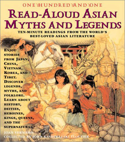

Generated caption:  drawing of people with faces and the title " read - loud ancient myths and legends "




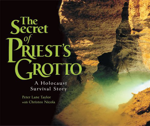

Generated caption:  drawing of a man in a river and the title " the secret of priest's grotto "




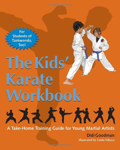

Generated caption:  image of karate people with the title " the kid's karate workbook "




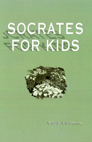

Generated caption:  picture of a green background with the title " dromedary "




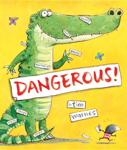

Generated caption:  drawing of a green crocodile with the captions " danger! " and " dangerous! "




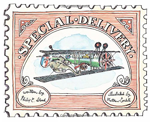

Generated caption:  drawing of a green airplane and the title " special delectable "




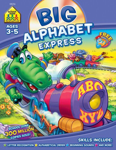

Generated caption:  drawing of a green dinosaur and the title " big letter express "




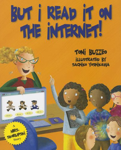

Generated caption:  drawing of a man with glasses and children with the title " but i read it on the internet! "




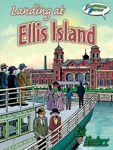

Generated caption:  drawing of people in a boat with the title " ellis island "




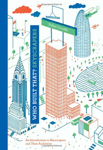

Generated caption:  drawing of a city with the caption " city "




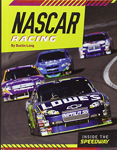

Generated caption:  picture of race cars with the title " nascar "




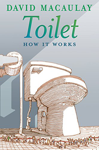

Generated caption:  drawing of a toilet bowl and the title " toilet how it works "




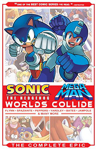

Generated caption:  drawing of a blue superhero with the title " sonic the battleman "




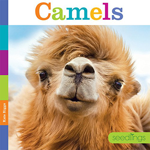

Generated caption:  picture of a camel with the title " camels "




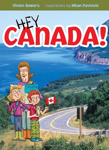

Generated caption:  drawing of two kids and a girl holding a flag by a road with the title " he canada! "




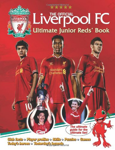

Generated caption:  drawing of soccer players with the title " liverpool fc ultimate junior red book "




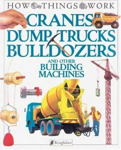

Generated caption:  drawing of a yellow truck with the title " cranes "




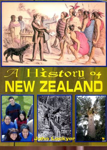

Generated caption:  drawing of people and a man with a dog and the caption " a history of new zealand "




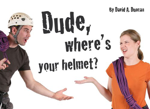

Generated caption:  picture of two boys and a helmet with the title " dude, where's your helmet? "




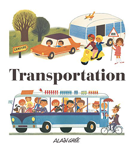

Generated caption:  drawing of people riding a bus and the title " transportation "




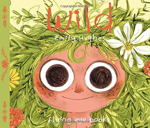

Generated caption:  drawing of a smiling girl with the title " wild "




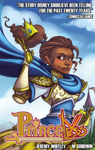

Generated caption:  drawing of a woman holding a golden sculpt with the title " dan hero "




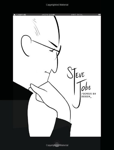

Generated caption:  drawing of a man with the title " steedelvias "




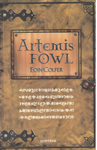

Generated caption:  drawing of a bird with the title " artemis fowl "




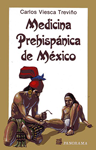

Generated caption:  drawing of a man and a woman with red hat and a mexican man with the title " my precharosa del mexico "




In [35]:
for item in imgs_captions:
    image = imgs_captions[item]['image']
    width, height = image.size
    display(image.resize((int(0.3*width), int(0.3*height))))
    print('\033[1mGenerated caption: \033[0m',imgs_captions[item]['caption'])
    print('\n')

Save generated captions from both trained models.

## Format caption 
To serve as an input for ChatGPT API.

In [53]:
def clean_sentence(sentence):
    return sentence.replace('children\'s drawing of ','').replace('\'','\\\'').replace('\\\'','\'')

In [54]:
captions_file = open(checkpoint + '.txt', 'w')
for item in imgs_captions:
    caption = clean_sentence(imgs_captions[item]['caption'])
    captions_file.write('{0},\"{1}\"\n'.format(item,caption))
captions_file.close()